# 4. Modeling / Evaluation

## 4.1 Imports

In [ ]:
from google.colab import drive, files
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import pickle, dill
import sys
import sklearn.metrics

## 4.2 Initialization

In [ ]:
#path to saved resources
saved_resources_path = '/content/gdrive/MyDrive/Capstone3/SavedResources'

#path to src folder
src_path = '/content/gdrive/MyDrive/Capstone3/src'

#path to saved model weights
model_path = '/content/gdrive/MyDrive/Capstone3/models/'

#mount google drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#add the src folder to the search path so that modules in the src folder can be imported
sys.path.append('/content/gdrive/MyDrive/Capstone3/src')
import BuildModels
import DataSetup

The **DataSetup.py** script contains functions that are useful for preparing the dataset. This includes setting up the folder structure, performing the train/test split, and setting up the test set from the image directories. The **BuildModels.py** script contains functions to prepare the architecture for each model, compile the model, and evaluate the model on the test data.

In [ ]:
#load saved constants
with open(os.path.join(saved_resources_path, 'constants_dict.pkl' ), 'rb') as handle:
    constants_dict = pickle.load(handle)

constants_dict

{'CLASS_SIZE': 5000, 'IMAGE_SIZE': (768, 768), 'K': 5, 'RANDOM_SEED': 42}

In [ ]:
#set batch size
BATCH_SIZE = 32

In [ ]:
#load the mappings of image class to folder location within the raw dataset
with open(os.path.join(saved_resources_path, 'dict_original_image_paths.pkl' ), 'rb') as handle:
    dict_image_paths = pickle.load(handle)

dict_image_paths

{'colon_aca': 'lung_colon_image_set/colon_image_sets/colon_aca/',
 'colon_normal': 'lung_colon_image_set/colon_image_sets/colon_n/',
 'lung_aca': 'lung_colon_image_set/lung_image_sets/lung_aca/',
 'lung_normal': 'lung_colon_image_set/lung_image_sets/lung_n/',
 'lung_scc': 'lung_colon_image_set/lung_image_sets/lung_scc/'}

## 4.3 Load and Prepare Data

### 4.3.1 Upload API key to connect to kaggle

In [ ]:
#upload the API key (kaggle.json)
_ = files.upload()

Saving kaggle.json to kaggle.json


### 4.3.2 Download and Unzip the Dataset

In [ ]:
###download and unzip the lung and colon cancer image dataset using the saved function "dataset_setup"
with open(os.path.join(saved_resources_path,'dataset_setup_function.pkl'), 'rb') as file_in:
    dataset_setup = dill.loads(dill.load(file_in))

dataset_setup()

 99% 1.75G/1.76G [00:08<00:00, 247MB/s]
100% 1.76G/1.76G [00:08<00:00, 232MB/s]


### 4.3.3 Train/Test Split

**Setup train/test folders**

In [ ]:
###set up the folder structure for the data using the saved function "folder_setup"

#image classes
image_classes = dict_image_paths.keys()

#function returns the folder paths for each image class in the train and test sets
train_test_path_dict = DataSetup.folder_setup(image_classes)

train_test_path_dict

{'test': {'data/test/colon_aca',
  'data/test/colon_normal',
  'data/test/lung_aca',
  'data/test/lung_normal',
  'data/test/lung_scc'},
 'train': {'data/train/colon_aca',
  'data/train/colon_normal',
  'data/train/lung_aca',
  'data/train/lung_normal',
  'data/train/lung_scc'}}

**Split the data into train/test sets**

In [ ]:
### split the data into train and test sets using the saved function "train_test_split"
DataSetup.train_test_split(saved_resources_path)

In [ ]:
##Ensure that there are no overlapping images in the train and test sets
##and that the train/test set sizes are correct
train_test_folders = ['data/train', 'data/test']

for img_class, path in dict_image_paths.items():
    train_path = os.path.join(train_test_folders[0],img_class)
    test_path = os.path.join(train_test_folders[1],img_class)

    train_set = set(os.listdir(train_path))
    test_set = set(os.listdir(test_path))

    #ensure no overlapping images
    assert len(train_set.intersection(test_set)) == 0

    #ensure the training and test set sizes are correct
    assert len(train_set) == constants_dict['CLASS_SIZE'] * 0.9
    assert len(test_set) ==  constants_dict['CLASS_SIZE'] * 0.1

## 4.4 Model Evaluation

The models will be assessed based on accuracy. The best original model and best transfer learning model will be examined further.

In [ ]:
#dataframe to store model scores
df_model_scores = pd.DataFrame(columns=['Model','Accuracy','Transfer Learning'])

#variable to hold the metric we are using
metric = 'accuracy'

In [ ]:
#function to get the row in the scores dataframe for each model
def get_score_row(model, model_name, results, metric, isTransfer=False):

    #get the index of the metric in the scores list
    metric_index = model.metrics_names.index(metric)

    #get the score for the specified metric
    score = results[metric_index]

    #indicate whether the model is a transfer learning model
    transfer = 'NO'
    if isTransfer:
        transfer='YES'

    #return the score row for the specified model and metric
    score_row = {'Model':model_name, metric.capitalize():score, 'Transfer Learning':transfer}
    return score_row

### 4.4.1 Baseline Model

In [ ]:
###get the test data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
###Evaluate the baseline model

#input shape
input_shape = (BATCH_SIZE, constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2, 3)

#number of classes 
K = constants_dict['K']

#weights path
weights_path = os.path.join(model_path,'baseline/baseline_model_weights')

#assemble the model
baseline_model = BuildModels.build_baseline_model(input_shape, K)

#evaluate the model 
results = BuildModels.compile_evaluate_model(baseline_model, input_shape, weights_path, test_data)

#get the accuracy score
score_row = get_score_row(baseline_model, 'Baseline', results, metric)
df_model_scores = df_model_scores.append(score_row, ignore_index=True)
print('Accuracy: {}%'.format(round(score_row[metric.capitalize()] * 100, 2)))

79/79 [==============================] - 18s 89ms/step - loss: 0.3218 - accuracy: 0.9200
Accuracy: 92.0%


### 4.4.2 Dropout Model

In [ ]:
###get the test data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
###Evaluate the dropout model

#input shape
input_shape = (BATCH_SIZE, constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2, 3)

#number of classes 
K = constants_dict['K']

#weights path
weights_path = os.path.join(model_path,'dropout/dropout_model_weights')

#assemble the model
dropout_model = BuildModels.build_dropout_model(input_shape, K)

#evaluate the model 
results = BuildModels.compile_evaluate_model(dropout_model, input_shape, weights_path, test_data)

#get the accuracy score
score_row = get_score_row(dropout_model, 'Dropout', results, metric)
df_model_scores = df_model_scores.append(score_row, ignore_index=True)
print('Accuracy: {}%'.format(round(score_row[metric.capitalize()] * 100, 2)))

79/79 [==============================] - 7s 80ms/step - loss: 0.2644 - accuracy: 0.9016
Accuracy: 90.16%


### 4.4.3 Data Augmentation Model

In [ ]:
###get the test data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
###Evaluate the data augmentation model

#input shape
input_shape = (BATCH_SIZE, constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2, 3)

#number of classes 
K = constants_dict['K']

#random state
random_state = constants_dict['RANDOM_SEED']

#weights path
weights_path = os.path.join(model_path,'data_augmentation/data_augmentation_model_weights')

#assemble the model
augmented_model = BuildModels.build_data_augmentation_model(input_shape, K, random_state)

#evaluate the model 
results = BuildModels.compile_evaluate_model(augmented_model, input_shape, weights_path, test_data)

#get the accuracy score
score_row = get_score_row(augmented_model, 'Data Augmentation', results, metric)
df_model_scores = df_model_scores.append(score_row, ignore_index=True)
print('Accuracy: {}%'.format(round(score_row[metric.capitalize()] * 100, 2)))

79/79 [==============================] - 7s 83ms/step - loss: 0.0878 - accuracy: 0.9700
Accuracy: 97.0%


### 4.4.4 Deep CNN Model

In [ ]:
###get the test data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
###Evaluate the deep CNN model

#input shape
input_shape = (BATCH_SIZE, constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2, 3)

#number of classes 
K = constants_dict['K']

#weights path
weights_path = os.path.join(model_path,'deep/deep_model_weights')

#assemble the model
deep_model = BuildModels.build_deep_model(input_shape, K)

#evaluate the model 
results = BuildModels.compile_evaluate_model(deep_model, input_shape, weights_path, test_data)

#get the accuracy score
score_row = get_score_row(deep_model, 'Deep', results, metric)
df_model_scores = df_model_scores.append(score_row, ignore_index=True)
print('Accuracy: {}%'.format(round(score_row[metric.capitalize()] * 100, 2)))

79/79 [==============================] - 8s 93ms/step - loss: 0.2550 - accuracy: 0.9072
Accuracy: 90.72%


### 4.4.5 Deep CNN Model with Data Augmentation

In [ ]:
###get the test data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
###Evaluate the Deep Data Augmentation Model 

#input shape
input_shape = (BATCH_SIZE, constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2, 3)

#number of classes 
K = constants_dict['K']

#random state
random_state = constants_dict['RANDOM_SEED']

#weights path
weights_path = os.path.join(model_path,'deep_augmentation/deep_augmented_model_weights')

#assemble the model
deep_augmented_model = BuildModels.build_deep_augmented_model(input_shape, K, random_state)

#evaluate the model 
results = BuildModels.compile_evaluate_model(deep_augmented_model, input_shape, weights_path, test_data)

#get the accuracy score
score_row = get_score_row(deep_augmented_model, 'Deep Augmented', results, metric)
df_model_scores = df_model_scores.append(score_row, ignore_index=True)
print('Accuracy: {}%'.format(round(score_row[metric.capitalize()] * 100, 2)))

79/79 [==============================] - 8s 93ms/step - loss: 0.0835 - accuracy: 0.9704
Accuracy: 97.04%


### 4.4.6 ResNet50 Transfer Learning Model

In [ ]:
###get the test data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
#prepare the architecture for the resnet50 transfer learning model, 
#load the trainable weights, compile and evaluate the model

#input shape
input_shape = (constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2, 3)

#number of classes 
K = constants_dict['K']

#combine the resnet architecture and model head into the final model
base_model = BuildModels.build_resnet50_base(input_shape)
model_head = BuildModels.build_custom_head(base_model, K)
resnet50_model = BuildModels.build_final_model(base_model, model_head)

#get the weights for the trainable portion of the model
with open(os.path.join(model_path, 'transfer-resnet50/resnet50_trainable_weights.pkl' ), 'rb') as file_in:
    trainable_weights = pickle.load(file_in) 

#set the weights for the trainable portion of the model
i = 0
for layer in resnet50_model.layers:
    if layer.trainable:
        layer.set_weights(trainable_weights[i])
        i += 1

#compile the model
resnet50_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

#evaluate the model
results = resnet50_model.evaluate(test_data, verbose=1)

#get the accuracy score
score_row = get_score_row(resnet50_model, 'ResNet50', results, metric, isTransfer=True)
df_model_scores = df_model_scores.append(score_row, ignore_index=True)
print('Accuracy: {}%'.format(round(score_row[metric.capitalize()] * 100, 2)))

79/79 [==============================] - 15s 161ms/step - loss: 0.1757 - accuracy: 0.9896
Accuracy: 98.96%


### 4.4.7 DenseNet121 Transfer Learning Model

In [ ]:
###get the test data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
#prepare the architecture for the DenseNet121 transfer learning model, 
#load the trainable weights, compile and evaluate the model

#input shape
input_shape = (constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2, 3)

#number of classes 
K = constants_dict['K']

#combine the resnet architecture and model head into the final model
base_model = BuildModels.build_densenet121_base(input_shape)
model_head = BuildModels.build_custom_head(base_model, K)
densenet121_model = BuildModels.build_final_model(base_model, model_head)

#get the weights for the trainable portion of the model
with open(os.path.join(model_path, 'transfer-densenet121/densenet121_trainable_weights.pkl' ), 'rb') as file_in:
    trainable_weights = pickle.load(file_in) 

#set the weights for the trainable portion of the model
i = 0
for layer in densenet121_model.layers:
    if layer.trainable:
        layer.set_weights(trainable_weights[i])
        i += 1

#compile the model
densenet121_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

#evaluate the model
results = densenet121_model.evaluate(test_data, verbose=1)

#get the accuracy score
score_row = get_score_row(densenet121_model, 'DenseNet121', results, metric, isTransfer=True)
df_model_scores = df_model_scores.append(score_row, ignore_index=True)
print('Accuracy: {}%'.format(round(score_row[metric.capitalize()] * 100, 2)))

79/79 [==============================] - 17s 163ms/step - loss: 0.3956 - accuracy: 0.7776
Accuracy: 77.76%


## 4.5 Best Models

In [ ]:
df_model_scores.sort_values(metric.capitalize(), ascending=False, inplace=True)
df_model_scores

,Model,Accuracy,Transfer Learning
5,ResNet50,0.9896,YES
4,Deep Augmented,0.9704,NO
2,Data Augmentation,0.9700,NO
0,Baseline,0.9200,NO
3,Deep,0.9072,NO
1,Dropout,0.9016,NO
6,DenseNet121,0.7776,YES


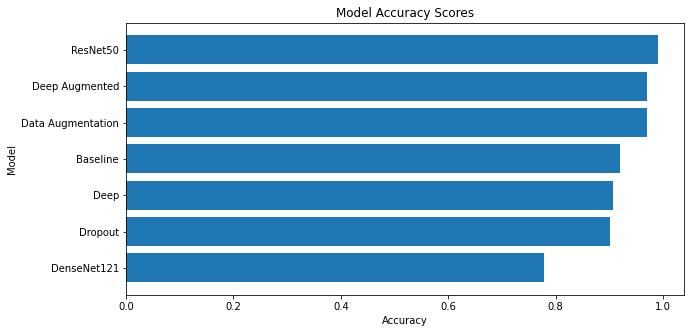

In [ ]:
#plot the model accuracy scores
fig, ax = plt.subplots(figsize=(10,5))
ax.barh('Model', 'Accuracy', data=df_model_scores.sort_values(metric.capitalize()), align='center');
ax.set_title('Model Accuracy Scores');
ax.set_xlabel('Accuracy');
ax.set_ylabel('Model');

The **Deep Augmented Model** was the best original model with an accuracy of 97.04%. This was an improvement of 5.04% over the baseline model. The **ResNet50 model** was the best performing transfer learning model, and best model overall, with an accuracy of 98.96%. This was an improvement of 6.96% over the baseline model.  

**Useful Functions for Examining the Best Models:**

In [ ]:
###function to get predicted and actual values
def get_pred_actual(model, data):
    #get predicted values
    y_pred = model.predict(data)
    y_pred = tf.argmax(y_pred, axis=1)

    #get actual values
    y_actual = tf.concat([y for x, y in data], axis=0)

    return y_pred, y_actual

In [ ]:
###function to plot the confusion matrix
def plot_confusion_matrix(y_pred, y_actual, class_names):

    #get the confusion matrix
    confusion_matrix = sklearn.metrics.confusion_matrix(y_actual, y_pred)

    #plot the confusion matrix
    fig, ax = plt.subplots(figsize=(10,7))
    sns.heatmap(confusion_matrix, annot=True, ax=ax, cbar=False, cmap='PuRd')
    ax.set_title('Confusion Matrix')
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_xticklabels(class_names);
    ax.set_yticklabels(class_names, rotation=0);

In [ ]:
#function to show feature maps for a specified convolutional layer
def show_feature_maps(layer, img, fig_title, num_rows=6, fig_height=15, show_first_n=None):

    #get the feature maps
    feature_maps = layer.predict(np.expand_dims(resized_img, axis=0))

    #number of feature maps
    num_feature_maps = feature_maps.shape[-1]
    if show_first_n is not None:
        num_feature_maps = show_first_n

    #number of columns to display
    num_cols = int(np.ceil(num_feature_maps/num_rows))

    #display each feature map
    fig, ax = plt.subplots(num_cols, num_rows, figsize=(15,fig_height))
    fig.suptitle(fig_title, size=20)
    #fig.tight_layout()
    fig.subplots_adjust(top=0.96)
    for i in range(len(ax.flatten())):
        #flatten the axis list for simple indexing
        current_ax = ax.flatten()[i]

        #hide the axis lines
        current_ax.axis('off')

        #display the feature map
        if i < num_feature_maps:
            current_ax.imshow(feature_maps[0,:,:,i]);

    plt.show()

In [ ]:
#function to get the first, last, and intermediate convolutional layer
def get_convolutional_layers(model):

    #get all the convolutional layers in the model
    layers = []
    for layer in model.layers:
        if 'Conv2D' in str(layer.__class__):
            layers.append(layer)

    if len(layers) == 0:
        return None


    #get first convolutional layer
    first_conv_layer = tf.keras.Model(inputs=model.inputs, outputs=layers[0].output)

    #get last convolutional layer
    last_conv_layer = None
    if len(layers) > 1:
        last_conv_layer = tf.keras.Model(inputs=model.inputs, outputs=layers[-1].output)

    #get an intermediate convolutional layer
    intermediate_conv_layer = None
    if len(layers) > 2:
        index = len(layers) //2
        intermediate_conv_layer = tf.keras.Model(inputs=model.inputs, outputs=layers[index].output)

    return first_conv_layer, intermediate_conv_layer, last_conv_layer

In [ ]:
#function to display examples of misclassified images
def display_misclassified_images(display_list, class_names, n_images=5):

    fig, ax = plt.subplots(1, n_images, figsize=(20,10))

    for i, info in enumerate(display_list):

        #display the image
        ax[i].imshow(info[0].astype('uint8'))
        ax[i].axis('off')

        #image title
        pred = class_names[info[1]]
        actual = class_names[info[2]]
        ax[i].set_title('Predicted: {} \n Actual: {}'.format(pred, actual))

    plt.show()  

In [ ]:
###function to get misclassified images, their predicted class, and their actual class
def get_misclassified_image_info(y_pred, y_actual, data):

    #indices where the model misclassified images
    incorrect_indices = np.where((y_pred.numpy() == y_actual.numpy()) == False)[0]

    #get the misclassified images, predictions, and labels
    misclassified_images = []
    index = 0
    for batch in data:
        
        #get the current batch of images
        images = batch[0]

        for image in images:

            #if misclassified, add to misclassified list
            if index in incorrect_indices:

                #tuple containing image, prediction, and label
                misclassified_info = (image.numpy(), 
                                      y_pred.numpy()[index], 
                                      y_actual.numpy()[index])
                
                misclassified_images.append(misclassified_info)

            index += 1

    return misclassified_images

### 4.5.1 Best Original Model - Deep CNN Model with Data Augmentation

#### 4.5.1.1 Model Architecture

In [ ]:
deep_augmented_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 384, 384, 3)       0         
                                                                 
 sequential_5 (Sequential)   (None, 384, 384, 3)       0         
                                                                 
 conv2d_15 (Conv2D)          (None, 382, 382, 32)      896       
                                                                 
 conv2d_16 (Conv2D)          (None, 380, 380, 32)      9248      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 190, 190, 32)     0         
 2D)                                                             
                                                                 
 conv2d_17 (Conv2D)          (None, 188, 188, 64)      18496     
                                                      

#### 4.5.1.2 Confusion Matrix

In [ ]:
###get the data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


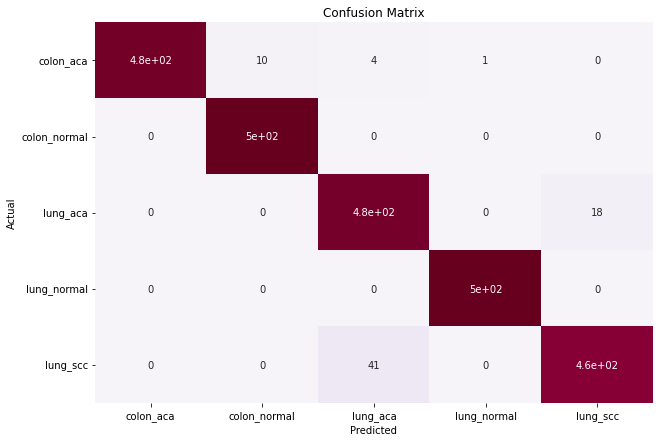

In [ ]:
###plot the confusion matrix

#get the predicted and actual values
y_pred, y_actual = get_pred_actual(deep_augmented_model, test_data)

#plot the confusion matrix
plot_confusion_matrix(y_pred, y_actual, test_data.class_names)

The Deep Augmented Model performed well on the test data. It did not misclassify any normal lung tissue. It was also 100% accurate when the predicted class was colon ACA. Interestingly, the model's strengths and weaknesses were those that were predicted by the PCA analysis during EDA. Specifically, the model's biggest problems were differentiating between the two types of lung cancer and, to a lesser degree, differentiating between normal and cancerous colon tissue. Also in agreement with the PCA analysis, the model was highly successful at classifying normal lung tissue. Overall, the biggest concern would be the cases where the model classifies colon ACA as normal colon tissue. This could lead to a failure to detect cancer in a patient. On the other hand, when the model predicts the wrong type of lung cancer it is still detecting cancer. Once cancer is detected, the patient's case would likely be examined by medical experts who would be able to correctly classify the tumour type.

#### 4.5.1.3 Misclassified Images

In [ ]:
###get the data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
###get misclassified image info

#get the predicted and actual values
y_pred, y_actual = get_pred_actual(deep_augmented_model, test_data)

misclassified_image_info = get_misclassified_image_info(y_pred, y_actual, test_data) 

**Colon ACA misclassified as Normal Colon**

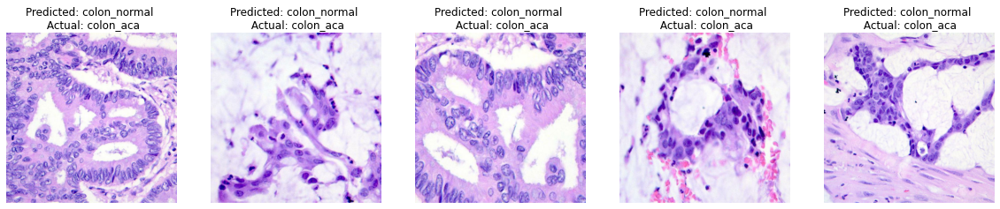

In [ ]:
#display colon aca misclassified as normal colon examples
pred_class = test_data.class_names.index('colon_normal')
actual_class = test_data.class_names.index('colon_aca')

count = 0
display_list = []
for info in misclassified_image_info:
    if (info[1] == pred_class) and (info[2] == actual_class):
        display_list.append(info)
        count += 1

    if count >= 5:
        break

display_misclassified_images(display_list, test_data.class_names)

The above images are colon ACA cases that were misclassified as normal colon tissue. It is difficult to comment on these images. However, a trained pathologist may be able to explain why the model struggles on these cases. There may be commonalities among the images that could explain the model's misclassification. It is also possible that these cases have a very similar appearance to normal colon tissue and would be among the more challenging cases for a pathologist to classify.

**Lung SCC misclassified as Lung ACA**

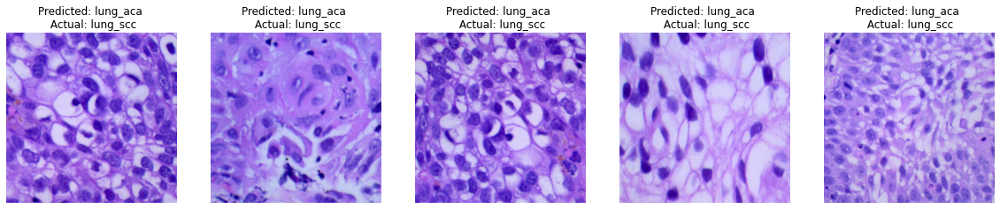

In [ ]:
#display lung scc misclassified as lung aca examples
pred_class = test_data.class_names.index('lung_aca')
actual_class = test_data.class_names.index('lung_scc')

count = 0
display_list = []
for info in misclassified_image_info:
    if (info[1] == pred_class) and (info[2] == actual_class):
        display_list.append(info)
        count += 1

    if count >= 5:
        break

display_misclassified_images(display_list, test_data.class_names)

The above images are lung SCC cases that were misclassified as lung ACA cases. It is difficult to comment on these images. However, a trained pathologist may be able to explain why the model struggles on these cases. There may be commonalities among the images that could explain the model's misclassification. It is also possible that these cases have a very similar appearance to lung SCC and would be among the more challenging cases for a pathologist to classify.

#### 4.5.1.4 Feature Maps

Below are examples of feature maps for the Deep Augmented Model. Feature maps for the first convolutional layer, last convolutional layer, and an intermediate convolutional layer are displayed for an example image from each image class. It is difficult to comment on the outputs. However, a trained pathologist may be able to provide some insights regarding the features that the model is extracting from the original images. That said, deep learning models tend to have low interpretability so it may not be possible to make sense of any of the extracted features. 

In [ ]:
###get the data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
#get the first, last, and a middel convolutional layer from the model
first_conv_layer, intermediate_conv_layer, last_conv_layer = \
                        get_convolutional_layers(deep_augmented_model)

In [ ]:
#get an image from each class
dict_class_image = {}
for img_class, path in dict_image_paths.items():
    img_path = path + os.listdir(path)[0]
    dict_class_image[img_class] = plt.imread(img_path)

##### 4.5.1.4.1 Lung Normal Class

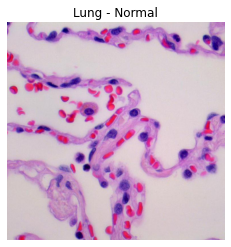

In [ ]:
###lung normal class

#get the original image
img = dict_class_image['lung_normal']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Lung - Normal')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

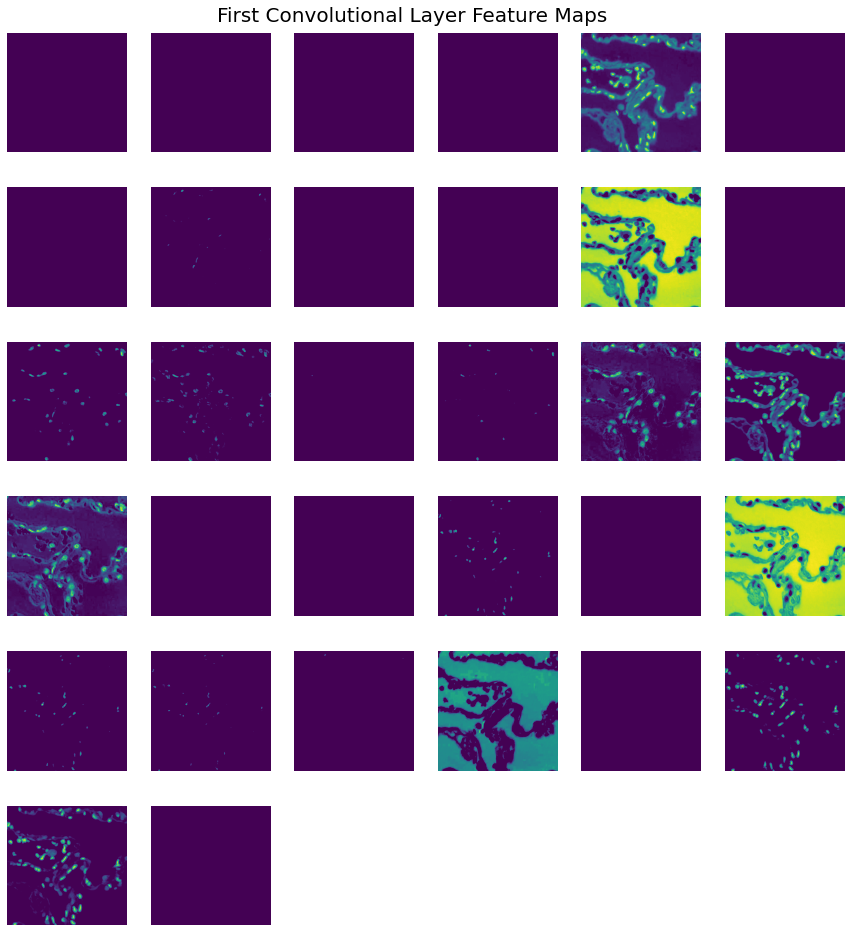

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title)

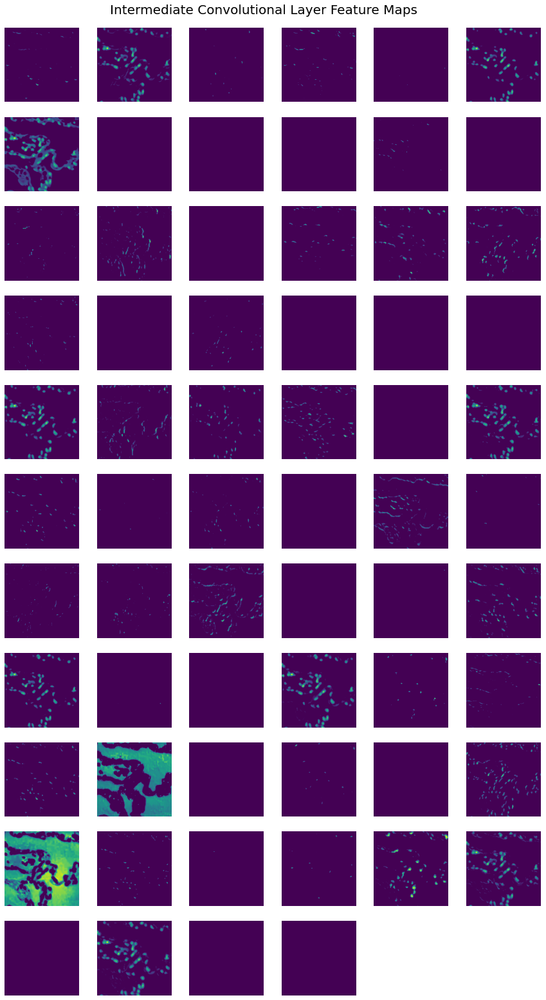

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=25)

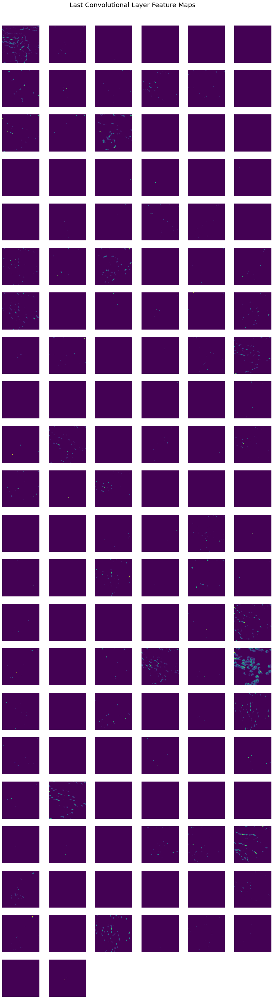

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50)

##### 4.5.1.4.2 Lung ACA Class

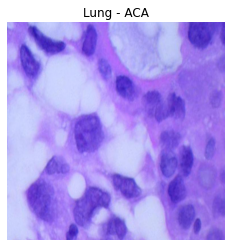

In [ ]:
###lung aca class

#get the original image
img = dict_class_image['lung_aca']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Lung - ACA')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

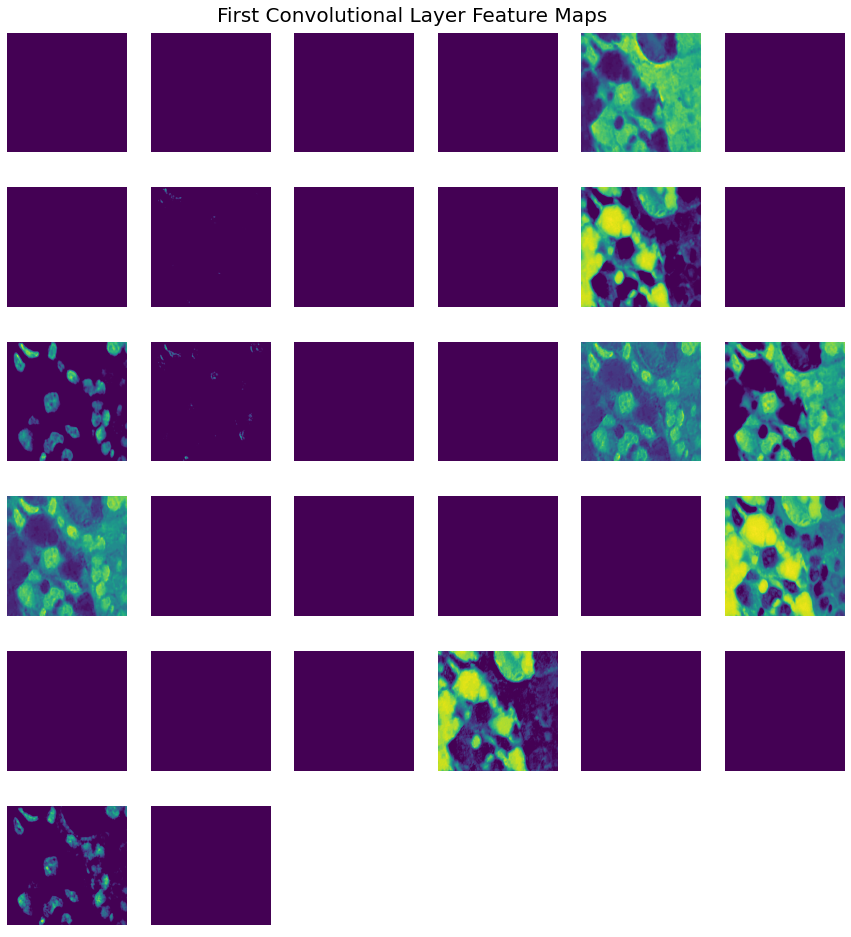

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title)

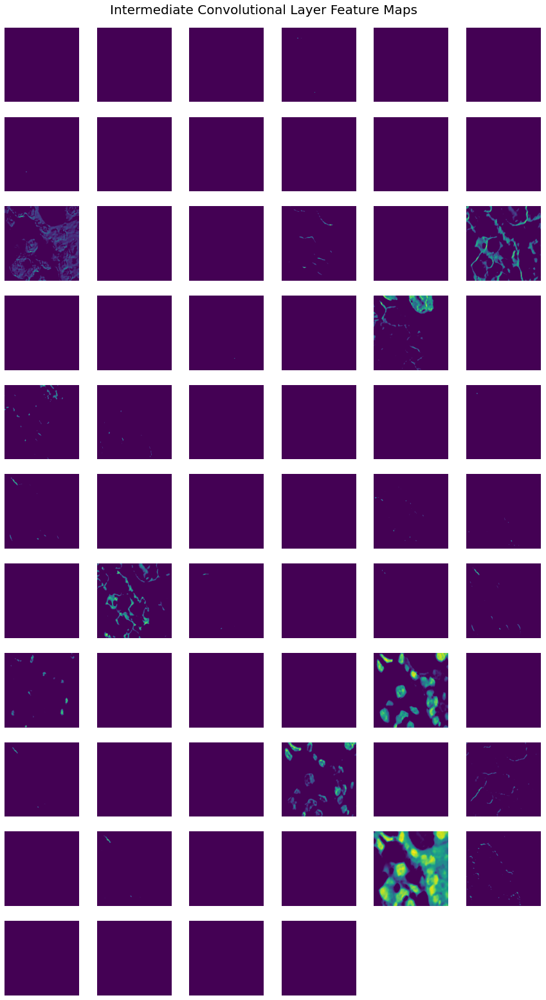

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=25)

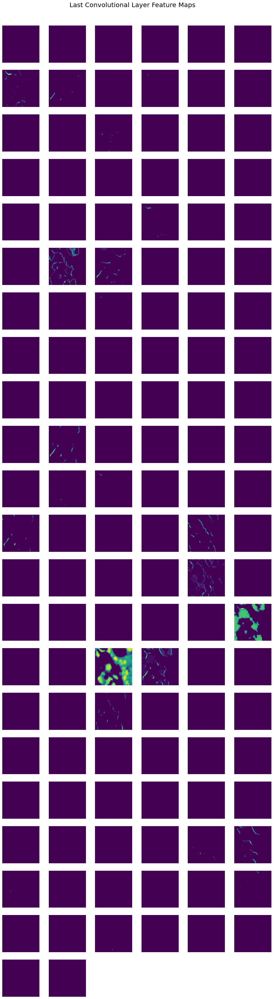

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50)

##### 4.5.1.4.3 Lung SCC Class

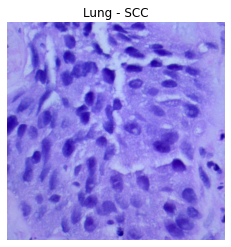

In [ ]:
###lung scc class

#get the original image
img = dict_class_image['lung_scc']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Lung - SCC')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

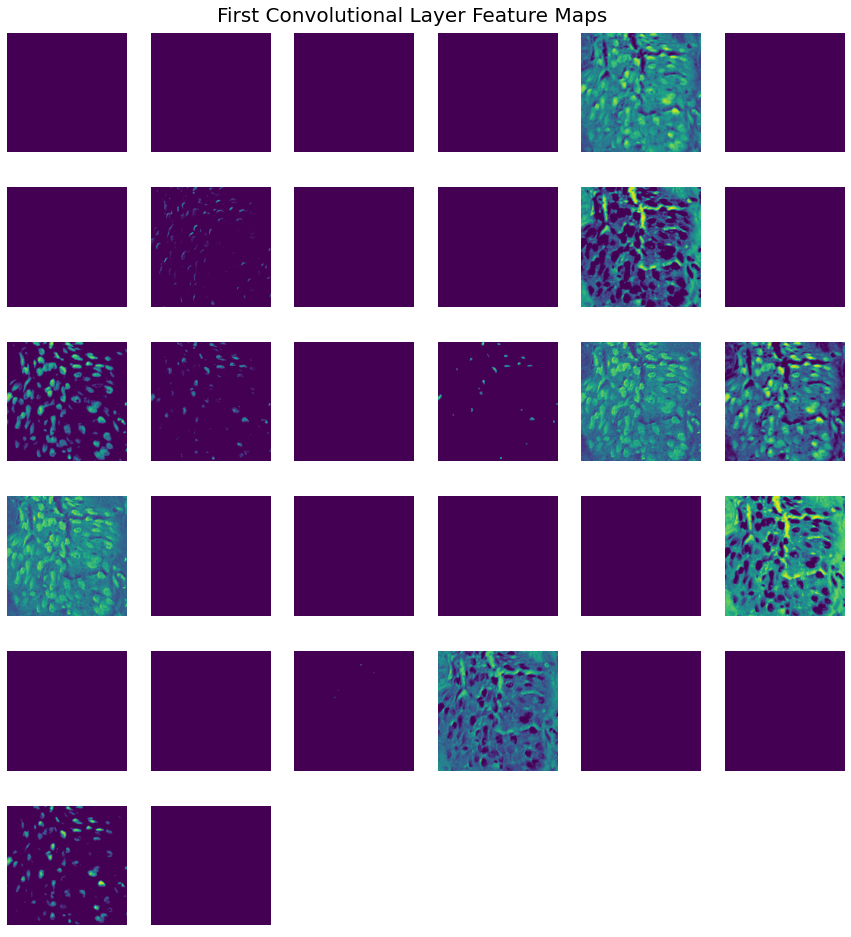

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title)

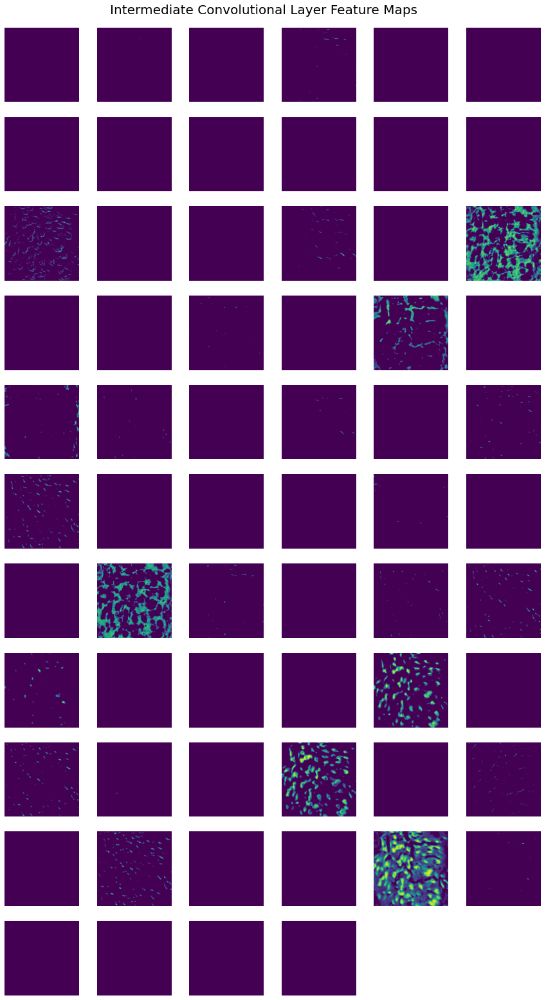

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=25)

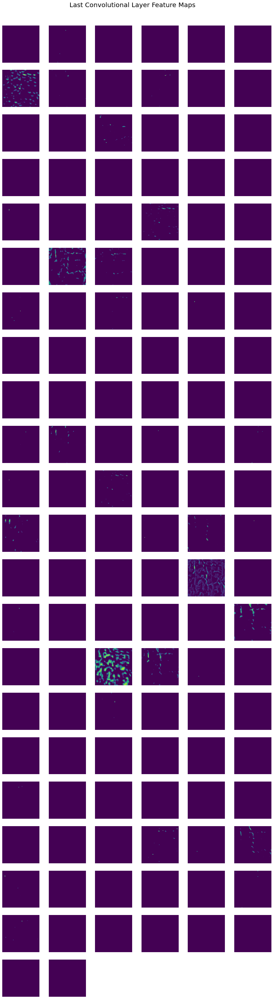

In [ ]:
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50)

##### 4.5.1.4.4 Colon Normal Class

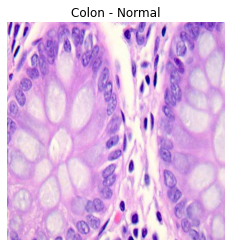

In [ ]:
###colon normal class

#get the original image
img = dict_class_image['colon_normal']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Colon - Normal')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

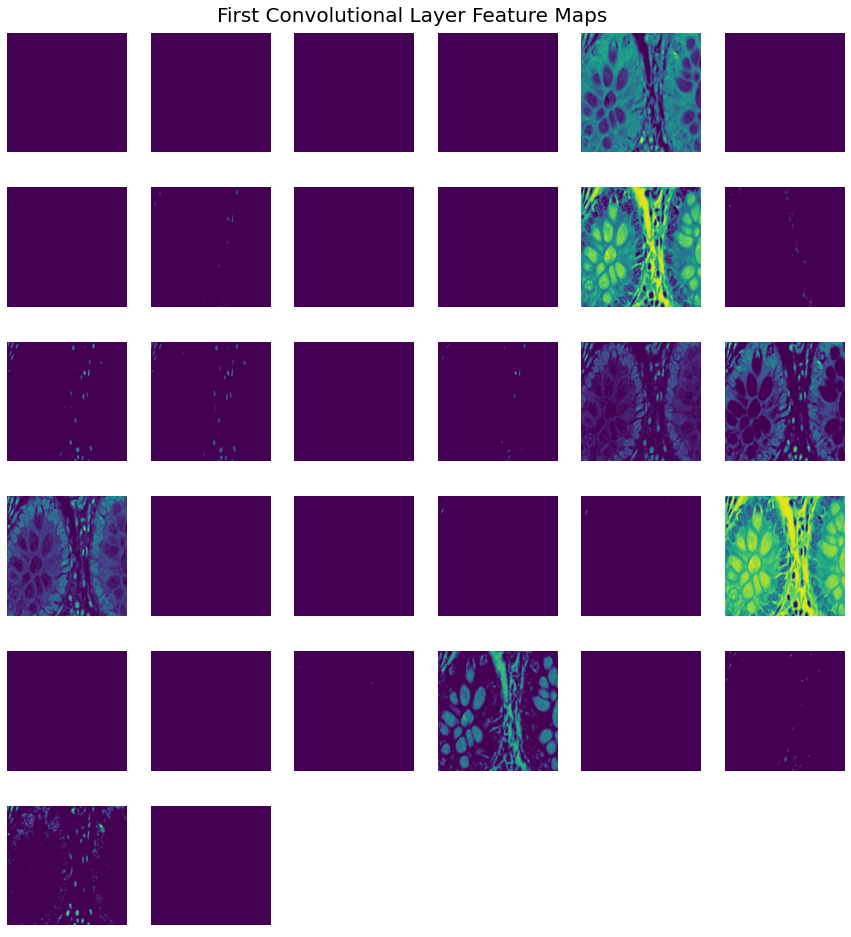

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title)

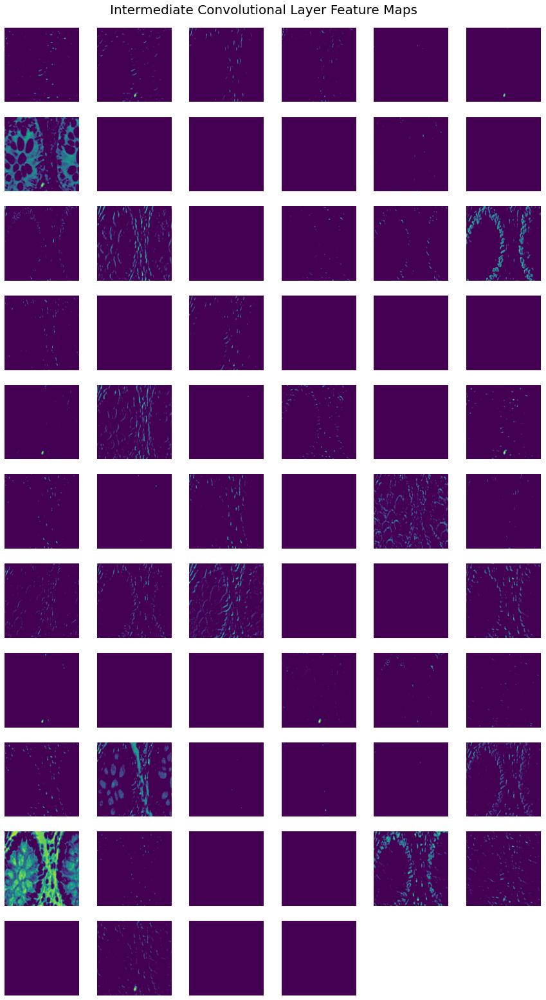

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=25)

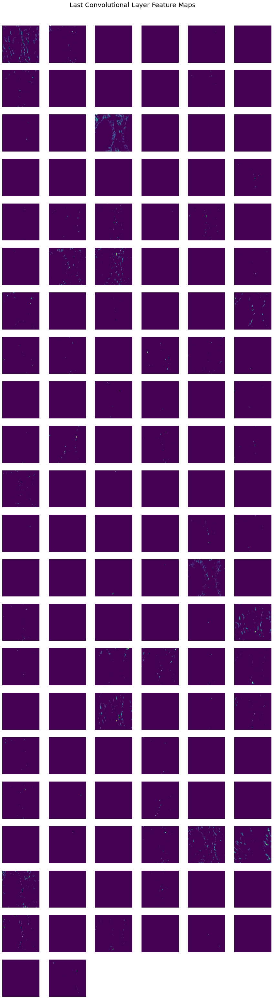

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50)

##### 4.5.1.4.5 Colon ACA Class

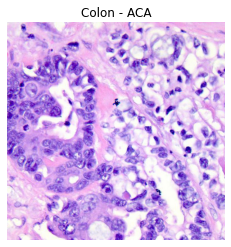

In [ ]:
###colon aca class

#get the original image
img = dict_class_image['colon_aca']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Colon - ACA')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

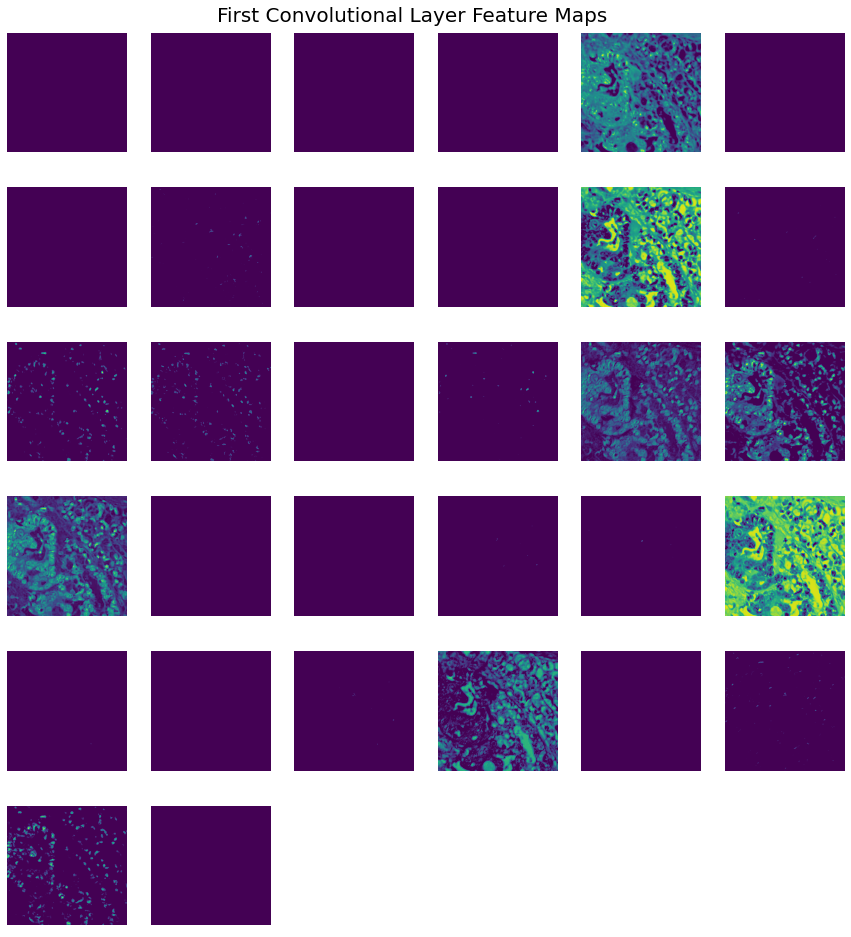

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title)

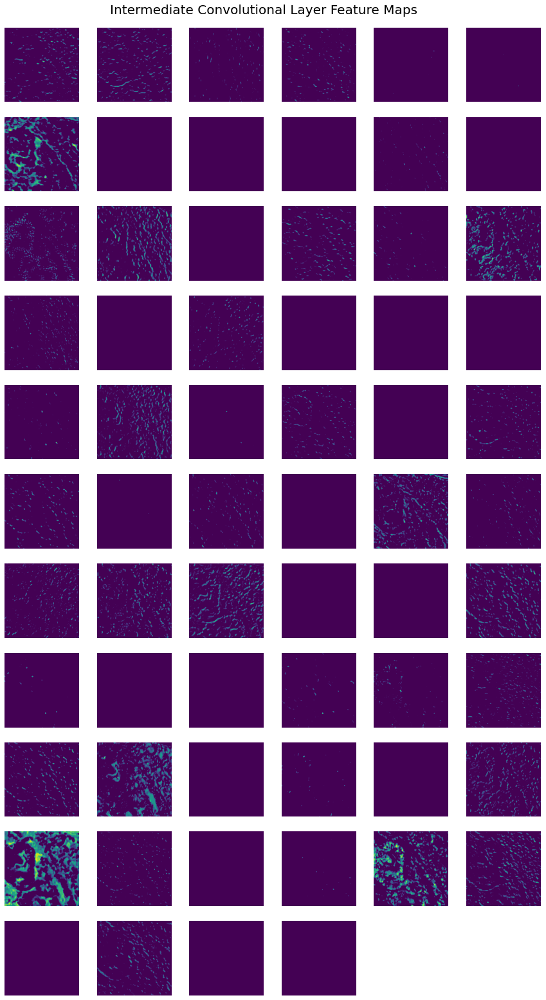

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=25)

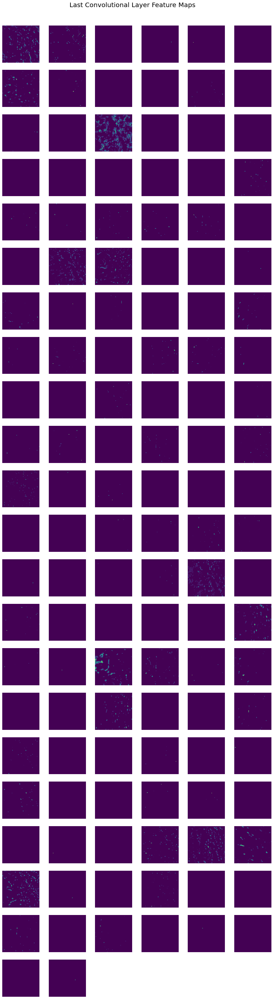

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50)

### 4.5.2 Best Transfer Learning Model - ResNet50

#### 4.5.2.1 Model Architecture

In [ ]:
resnet50_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 384, 384, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 390, 390, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 192, 192, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

#### 4.5.2.2 Confusion Matrix

In [ ]:
###get the data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


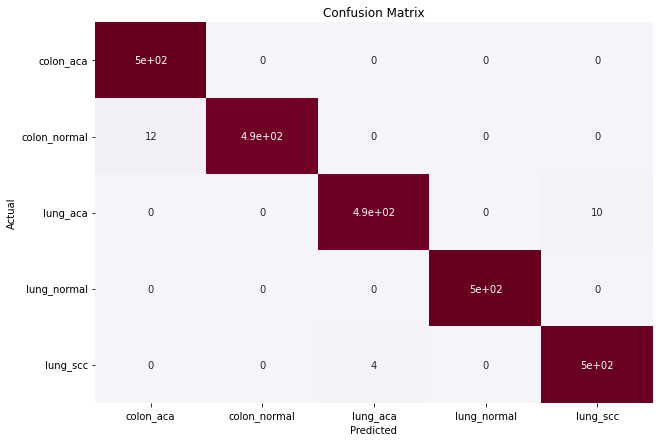

In [ ]:
###plot the confusion matrix

#get the predicted and actual values
y_pred, y_actual = get_pred_actual(resnet50_model, test_data)

#plot the confusion matrix
plot_confusion_matrix(y_pred, y_actual, test_data.class_names)

The ResNet50 Model was the most accurate model when evaluated on the test set. It did not misclassify any normal lung or colon ACA tissue. It was also 100% accurate when the predicted class was normal colon or normal lung tissue. Interestingly, the model's strengths and weaknesses were those that were predicted by the PCA analysis during EDA. Specifically, the model's biggest problems were differentiating between the two types of lung cancer and differentiating between normal and cancerous colon tissue. Regardless, the model performed very well. Also in agreement with the PCA analysis, the model was highly successful at classifying normal lung tissue. Fortunately, this model's errors tended to be false positives, rather the false negatives, when predicting colon cancer. Therefore, it is less likely that colon cancer cases will go undetected compared to the Deep Augmented Model. There were also a few lung cancer cases where the model predicted the incorrect cancer type. However, since cancer was still predicted this would not lead to a patient's cancer going undetected. This, along with the model's high degree of accuracy, makes it the best model for classifying lung and colon cancer tissue.

#### 4.5.2.3 Misclassified Images

In [ ]:
###get the data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
###get misclassified image info

#get the predicted and actual values
y_pred, y_actual = get_pred_actual(resnet50_model, test_data)

misclassified_image_info = get_misclassified_image_info(y_pred, y_actual, test_data) 

**Normal Colon misclassified as Colon ACA**

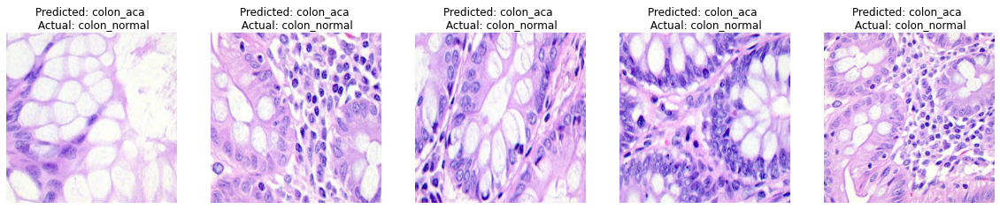

In [ ]:
#display colon aca misclassified as normal colon examples
pred_class = test_data.class_names.index('colon_aca')
actual_class = test_data.class_names.index('colon_normal')

count = 0
display_list = []
for info in misclassified_image_info:
    if (info[1] == pred_class) and (info[2] == actual_class):
        display_list.append(info)
        count += 1

    if count >= 5:
        break

display_misclassified_images(display_list, test_data.class_names)

The above images are examples of normal colon tissue that were misclassified as colon ACA. It is difficult to comment on these images. However, a trained pathologist may be able to explain why the model struggles on these cases. There may be commonalities among the images that could explain the model's misclassification. It is also possible that these cases have a very similar appearance to colon ACA and would be among the more challenging cases for a pathologist to classify.

**Lung ACA misclassified as Lung SCC**

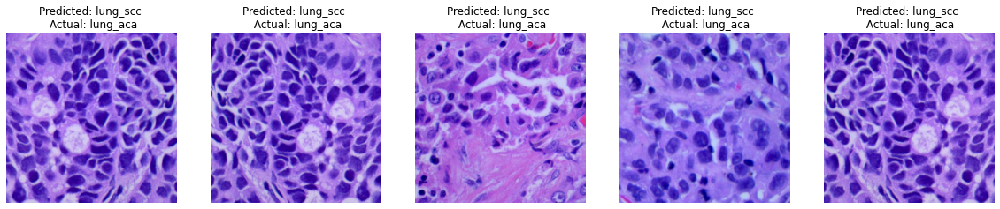

In [ ]:
#display colon aca misclassified as normal colon examples
pred_class = test_data.class_names.index('lung_scc')
actual_class = test_data.class_names.index('lung_aca')

count = 0
display_list = []
for info in misclassified_image_info:
    if (info[1] == pred_class) and (info[2] == actual_class):
        display_list.append(info)
        count += 1

    if count >= 5:
        break

display_misclassified_images(display_list, test_data.class_names)

The above images are examples of lung ACA tissue that were misclassified as lung SCC. It is difficult to comment on these images. However, a trained pathologist may be able to explain why the model struggles on these cases. There may be commonalities among the images that could explain the model's misclassification. It is also possible that these cases have a very similar appearance to lung SCC and would be among the more challenging cases for a pathologist to classify.

#### 4.5.2.4 Feature Maps

Below are examples of feature maps for the ResNet50 Model. Feature maps for the first convolutional layer, last convolutional layer, and an intermediate convolutional layer are displayed for an example image from each image class. For layers with more than 128 outputs only the first 128 feature maps were displayed. It is difficult to comment on the outputs. However, a trained pathologist may be able to provide some insights regarding the features that the model is extracting from the original images. That said, deep learning models tend to have low interpretability so it may not be possible to make sense of any of the extracted features. 

In [ ]:
###get the data

#random_state
random_state = constants_dict['RANDOM_SEED']

#image_size
image_size=(constants_dict['IMAGE_SIZE'][0]//2, constants_dict['IMAGE_SIZE'][1]//2)

#get the test set
test_data = DataSetup.test_dataset_from_directory(random_state, image_size, BATCH_SIZE)

Found 2500 files belonging to 5 classes.


In [ ]:
#get the first, last, and a middel convolutional layer from the model
first_conv_layer, intermediate_conv_layer, last_conv_layer = \
                        get_convolutional_layers(resnet50_model)

In [ ]:
#get an image from each class
dict_class_image = {}
for img_class, path in dict_image_paths.items():
    img_path = path + os.listdir(path)[0]
    dict_class_image[img_class] = plt.imread(img_path)

##### 4.5.2.4.1 Lung Normal Class

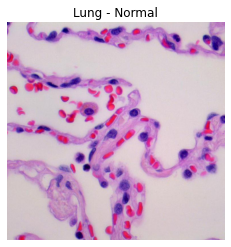

In [ ]:
###lung normal class

#get the original image
img = dict_class_image['lung_normal']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Lung - Normal')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

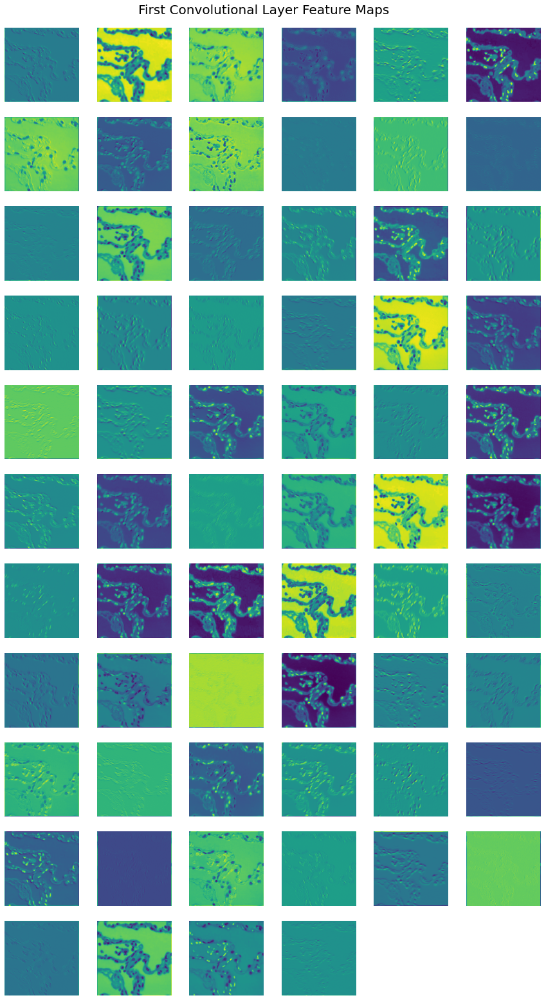

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title, fig_height=25)

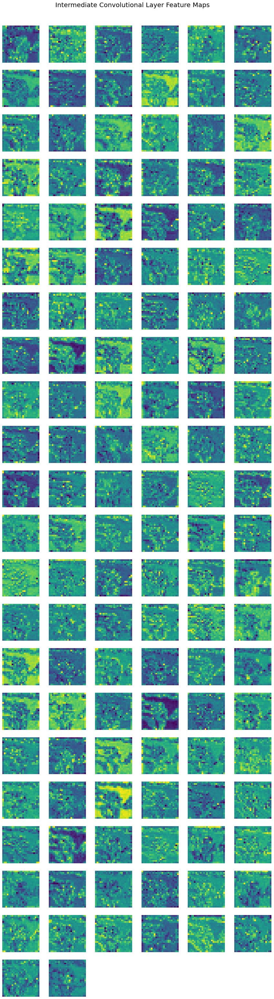

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

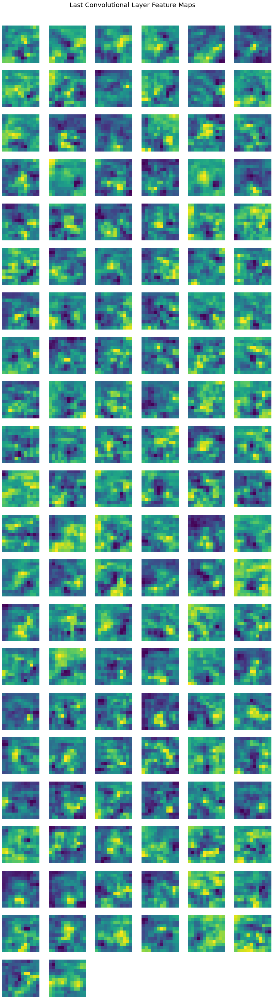

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

##### 4.5.2.4.2 Lung ACA Class

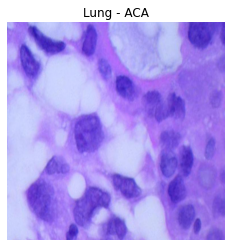

In [ ]:
###lung aca class

#get the original image
img = dict_class_image['lung_aca']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Lung - ACA')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

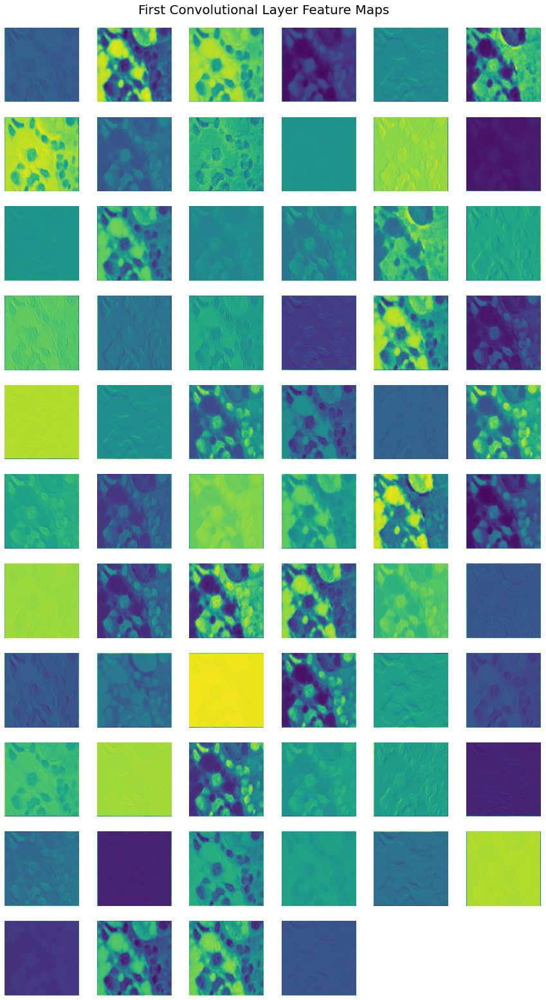

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title, fig_height=25)

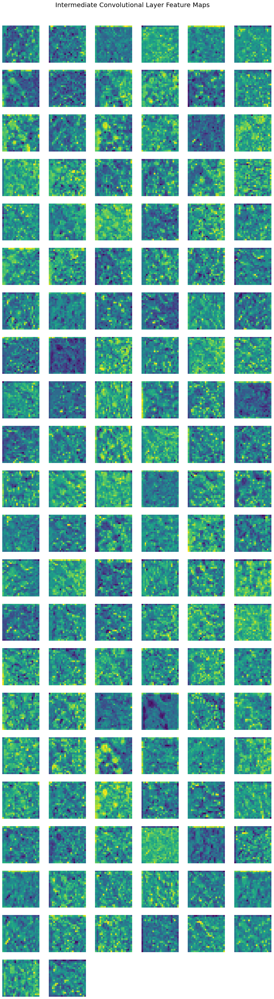

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

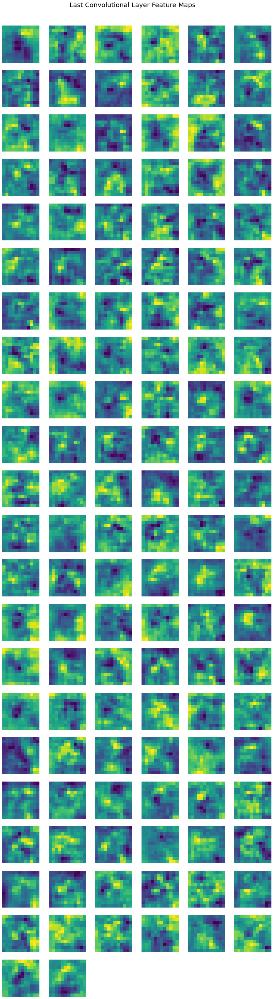

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

##### 4.5.2.4.3 Lung SCC Class

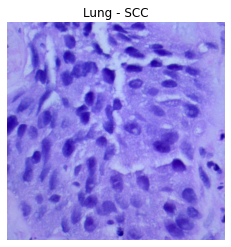

In [ ]:
###lung scc class

#get the original image
img = dict_class_image['lung_scc']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Lung - SCC')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

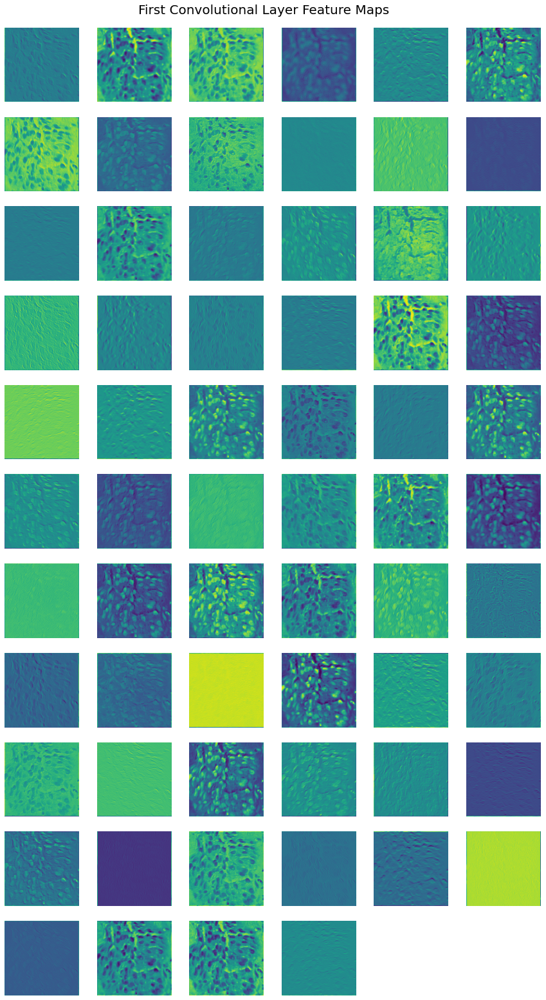

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title, fig_height=25)

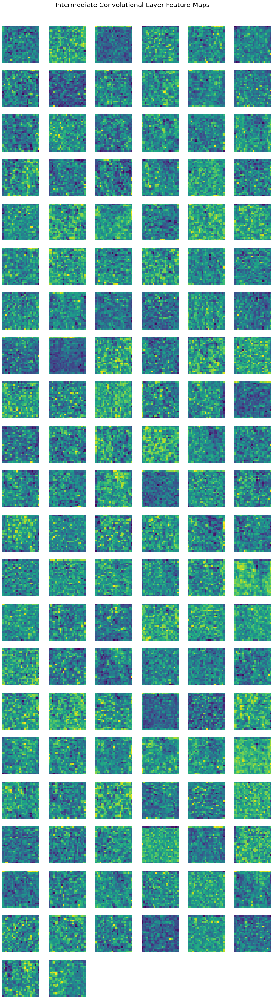

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

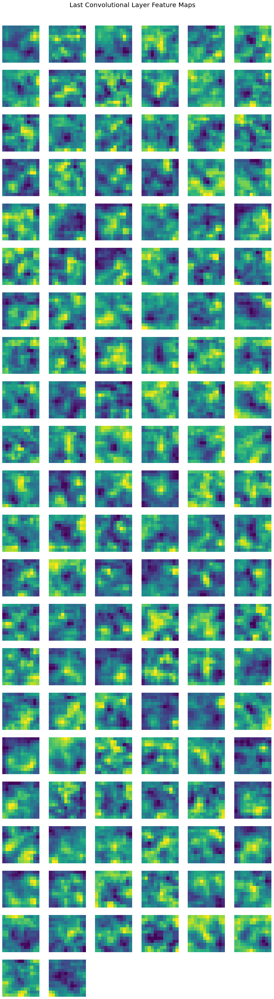

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

##### 4.5.2.4.4 Colon Normal Class

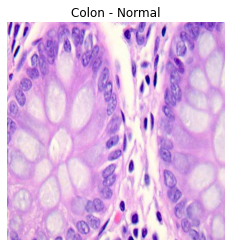

In [ ]:
###colon normal class

#get the original image
img = dict_class_image['colon_normal']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Colon - Normal')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

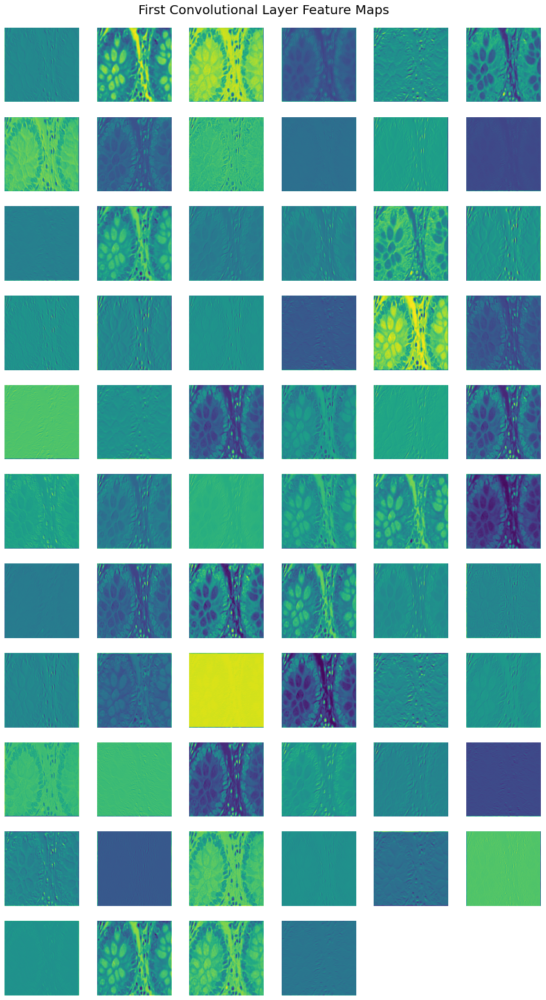

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title, fig_height=25)

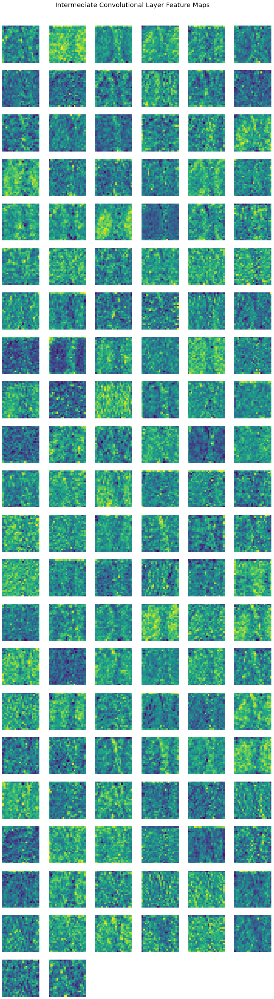

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

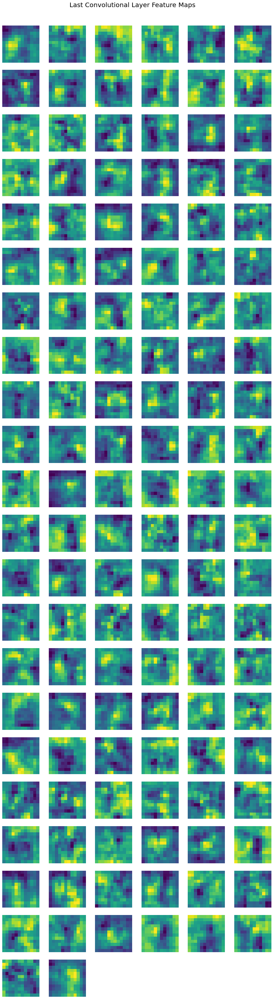

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

##### 4.5.2.4.5 Colon ACA Class

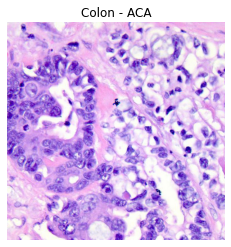

In [ ]:
###colon aca class

#get the original image
img = dict_class_image['colon_aca']
fig, ax = plt.subplots();
ax.imshow(img);
ax.set_title('Colon - ACA')
ax.axis('off')

#resize the image to correct input size
resized_img = tf.image.resize(img, [384,384], preserve_aspect_ratio=True)

In [ ]:
#show feature maps - first convolutional layer
fig_title = 'First Convolutional Layer Feature Maps'
show_feature_maps(first_conv_layer, resized_img, fig_title, fig_height=25)

Output hidden; open in https://colab.research.google.com to view.

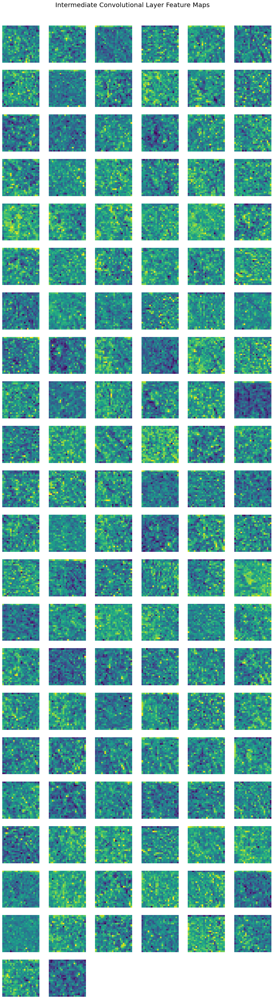

In [ ]:
#show feature maps - intermediate convolutional layer
fig_title = 'Intermediate Convolutional Layer Feature Maps'
show_feature_maps(intermediate_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

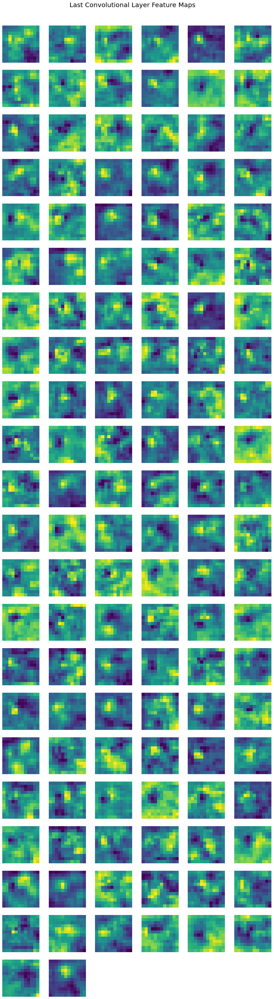

In [ ]:
#show feature maps - last convolutional layer
fig_title = 'Last Convolutional Layer Feature Maps'
show_feature_maps(last_conv_layer, resized_img, fig_title, fig_height=50, show_first_n=128)

## 4.6 Final Model - ResNet50 Transfer Learning Model

The **ResNet50 model** was selected as the final model. The ResNet50 model had the highest accuracy among all the models. Further analysis revealed that the ResNet50 model also minimized the number of missed cancer diagnoses on the test dataset. For a task such as cancer diagnosis, it is very important to minimize the number of false negatives predicted by the model.   

## 4.7 Next Steps and Recommendations for Future Investigation



* There were limitations due available computing power. If more computing power was available it would be possible to take the following steps:
  * Train more models, which would allow a wider variety of model architectures to be tested including deeper and wider models.
  * Train the models without scaling down the size of the images. This may allow the models to extract features more effectively resulting in improved model performance.
  * Perform hyperparameter tuning on parameters such as learning rate, CNN kernel size, number of nodes in CNN dense layers, dropout rate in the dropout layers, and optimizer selection. 
    * The model with dropout layers performed particularly poorly. Testing different architectures with dropout layers or experimenting with different dropout rates may have been beneficial.
* Although the dataset contained 25000 images, it contained 750 original images. The Augmentor package was used by the creators of the dataset to increase the size to 25000. Therefore, the model may be less successful when generalizing to images outside of the dataset. If at all possible, it would likely be beneficial to collect more raw data on which to train the models.
* Transfer learning models benefit from fine tuning in some cases. After the model is trained some, or all, of the non-trainable layers can be unfrozen and the model can be retrained. A very low learning rate should be used for fine tuning to avoid overfitting. 
* It may be worth experimenting with training different models for each tissue type (i.e. separate models for lung tissue and colon tissue). The tissue type would typically be known ahead of time so feeding input data into the correct model should not pose a problem. This could be beneficial, as it might allow models to extract more specialized features. However, this approach would reduce the size of the training set for each model. Therefore, it could have the consequence of impairing the ability of some, or all, models to extract useful features from the image data.
* Collecting image data on more tissue and/or cancer types would allow a model to make predictions on a broader set of histopathological image classes. This would increase the utility of the model in a clinical setting. However, it would be important to ensure that the model's ability to make accurate predictions does not diminish as more classes are introduced. If this was a problem, it may be beneficial to experiment with different model architectures or acquire more training data if possible.